In [1]:
import os
import json
import time
import datetime as dt
import numpy as np
import pandas as pd
import factoroid as fr
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')

WebSQL = fr.connector.MySQLDB('db-01')
DevSQL = fr.connector.MySQLDB('db-dev')

Successfully connected; Factorid web services
Successfully connected; Factoroid development


In [2]:
from model.utils_function import *
from model.utils_cycle import *
from model.utils_output import *
from model.utils_main import *
from model.utils_preprocessor import *

In [3]:
now = dt.datetime.now().replace(hour=8, minute=0, second=0, microsecond=0)
now = now - dt.timedelta(days=2) if now.weekday() == 0 else now
print(now)
period_ = fr.utils.Period(['1days', str(now)])

2022-04-06 08:00:00


In [4]:
str_datetime = str(now.date())
if not os.path.exists(f'./result/{str_datetime}'):
    os.mkdir(f'./result/{str_datetime}')

In [5]:
import json
with open('./parameter/equipment_properties.json', 'r') as file:
    parameter = json.load(file)

key_lst =  list(parameter.keys())[5:25]
key_lst.remove('vc630')

In [13]:
key_lst

['DMU 50 3rd Generation #2',
 'DMC60T#3',
 'ECOSPEED F1040 #2',
 'CMI 3S #8',
 'G3020 #1',
 'EVER 7',
 'H5-800',
 'HU80A-5X',
 'KT MODU LINE #3',
 'MC18200 #1',
 'MP2150',
 'MYNX500#1',
 'SB-416',
 'SNK RB-200F(2060)',
 'VMP8-6P',
 'YK 3070(TCP-30TS)',
 'FMS ZT-800 #3',
 'HFP1540 PROTO',
 'VC630/5AX #S4']

SB-416


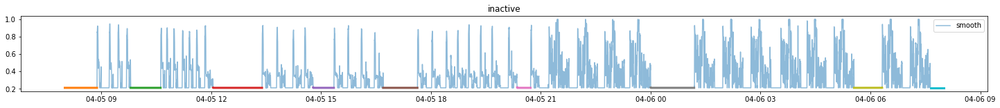

KeyboardInterrupt: 

In [16]:
# index_, plotting, company = 0, True, 'yg'
plotting, company = True, 'yg'
config.plot = plotting
config.company = company

for machine in key_lst[12:13]:
    print(machine)
    parameter, gap, threshold, min_threshold, smooth_factor, step, upper_limit, mac_main, window, max_cycle, idle_value = params(machine)
    row = WebSQL.get_data(mac=mac_main, period=period_.utc)
    data_ = fr.processor.preprocess(row)
    
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=data_.timestamp, y=data_.value, mode='lines', line=dict(width=2, color='#1f77b4'), opacity=1.0, name='current data', showlegend=True))
    fig.update_xaxes(showline=True, linewidth=1, linecolor='black', mirror=True, showgrid=False, rangeslider_visible=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='black', mirror=True, showgrid=False)
    fig.update_layout(autosize=False, plot_bgcolor='white', width=1500, height=200, margin=dict(l=5,r=5,b=10,t=10,pad=2), legend=dict(orientation='h', yanchor='bottom', y=1.04, xanchor='left', x=0))
    fig.show()
    
    # cleaning + smoothing + inactive phase detection
    times_, y_ = cleaning(data_, smooth_factor, min_threshold)
    smooth_ = smoothing(y_, step)
    times, ss, inactive_cycles_ = inactive_phase_cleaning_normalization(smooth_, times_, upper_limit, window, so_range=None)

    # active phase detection
    cycles_ = active_phase(ss, times, threshold, upper_limit, max_cycle * 60, gap, idle_value)
    cycles = cycle_generate(cycles_, times, ss, inactive_cycles_, so_range=None)

    active_phase_idx = 0
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=pd.to_datetime(times), y=ss, mode='lines', opacity=0.3, name='smooth', showlegend=False))
    for _, c in enumerate(cycles):
        xx, yy = pd.to_datetime([aa[0] for aa in c]), [aa[1] for aa in c]
        center_idx, max_yy = int(len(xx)//2), max(yy)
        fig.add_trace(go.Scatter(x=xx, y=yy, mode='lines', name=f'{active_phase_idx}', line=dict(width=3)))
        fig.add_trace(go.Scatter(x=[xx[center_idx]], y=[max_yy*1.1], mode='markers+text', text=f'{active_phase_idx}',
                        textposition='middle center', textfont=dict(family='bold', color='black'),
                        marker=dict(color='gray',opacity=0.2,size=15, line=dict(color='black', width=2)), showlegend=False))
        active_phase_idx += 1
    fig.update_xaxes(showline=True, linewidth=1, linecolor='black', mirror=True, showgrid=False, rangeslider_visible=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='black', mirror=True, showgrid=False)
    fig.update_layout(autosize=False, plot_bgcolor='white', width=1500, height=250, margin=dict(l=5,r=5,b=10,t=10,pad=2))
    fig.show()

    # cycle parameter
    cycle_parameter = parameter[machine]['cycle']
    cycle_parameter['L'] = 500 if cycle_parameter['lower_limit'] <= 100 else 1000
    # cycle_parameter['L'] = 500 if cycle_parameter['lower_limit'] <= 100 and machine not in ['SNK RB-200F(2060)'] else 1000
    cycle_parameter['min_dist'] = round(max(cycle_parameter['lower_limit'] ** 0.4, 2.8), 1) * 1.3
    cycle_parameter['order'] = int(min(max(cycle_parameter['lower_limit'] ** 0.6, 5), 15))
    cycle_parameter['gap'] = 50
    cycle_parameter['n'] = 5
    cycle_parameter['cycle_gap'] = [30, 60][machine not in {"G3020 #1"}]

    # order_number 미사용
    patterns, candidates, first_phase, last_phase = pattern_detector(cycles, cycle_parameter, machine, '')
    output, complete_cycle = best_cycle(patterns, quantity=-1)
    
    ww = sorted([cy for cy in complete_cycle if cy[1] != -1])
    cycle_idx = 0
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=pd.to_datetime(times), y=ss, mode='lines', opacity=0.3, name='smooth', showlegend=False))
    for _, c in enumerate(ww):
        temp1 = sum(cycles[c[0]:c[1] + 1], [])  # concatenate
        xx, yy = pd.to_datetime([xx[0] for xx in temp1]), [xx[1] for xx in temp1]
        center_idx, max_yy = int(len(xx)//2), max(yy)
        fig.add_trace(go.Scatter(x=xx, y=yy, mode='lines', name=f'{cycle_idx}', line=dict(width=3)))
        fig.add_trace(go.Scatter(x=[xx[center_idx]], y=[max_yy*1.1], mode='markers+text', text=f'{cycle_idx}',
                        textposition='middle center', textfont=dict(family='bold', color='black'),
                        marker=dict(color='gray',opacity=0.2,size=15, line=dict(color='black', width=2)), showlegend=False))
        cycle_idx += 1
    fig.update_xaxes(showline=True, linewidth=1, linecolor='black', mirror=True, showgrid=False, rangeslider_visible=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='black', mirror=True, showgrid=False)
    fig.update_layout(autosize=False, plot_bgcolor='white', width=1500, height=200, margin=dict(l=5,r=5,b=10,t=10,pad=2))
    fig.show()